# Análise de Dados

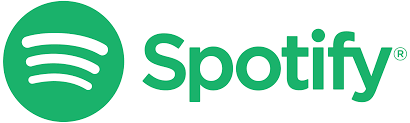

Davi Trost Gouveia					PC3010741

Mateus Augusto Viotto				PC3008967

Pedro Barriviera					PC3010155

# Dataframe das Músicas

### Importando as bibliotecas

In [143]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from PIL import Image
from io import BytesIO
import requests
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm
import plotly.graph_objects as go
import plotly.express as px

Importamos todas a bibliotecas necessárias para as análises  

## Juntando os arquivos dos dataframes

In [144]:
diretorioM = "./DataFrames/Musicas"
arquivosM = [arquivo for arquivo in os.listdir(diretorioM) if not arquivo.startswith('.')] # filtra essa lista, mantendo apenas os arquivos que não começam com "." (ponto).

df_musicas = pd.DataFrame()

for arquivo in arquivosM:
    data_atual = pd.read_csv(diretorioM+"/"+arquivo)
    df_musicas = pd.concat([df_musicas, data_atual])
    
diretorioU = "./DataFrames/Usuários"
arquivosU = [arquivo for arquivo in os.listdir(diretorioU) if not arquivo.startswith('.')] #Ignora arquivos escondidos

df_usuarios = pd.DataFrame()

for arquivo in arquivosU:
    data_atual = pd.read_csv(diretorioU+"/"+arquivo)
    data_atual['usuário'] = arquivo[:-4]
    df_usuarios = pd.concat([df_usuarios, data_atual])

Criamos o data frame ‘df_musicas’ e um for percorrerá cada arquivo da lista, e irá ler os arquivos CSV e os armazenar em data_atual e depois o adicionar ao DataFrame "df_musicas"

In [145]:
display(df_musicas.head(3))
df_usuarios.head(3)

,Unnamed: 0,track_id,track_name,artist_name,artist_genres,album_name,artist_id,popularity,duration_ms,explicit,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,0,4uqJelb9THHmJ3OCohg4ZJ,Nosso Quadro,Ana Castela,"['agronejo', 'funk rj', 'sertanejo pop']",Nosso Quadro,2CKOmarVWvWqkNWUatHCex,84,173698,False,...,9,-4.821,1,0.1950,0.338,0.0,0.311,0.602,160.018,4
1,1,0SCMVUZ21uYYB8cc0ScfbV,Bombonzinho - Ao Vivo,Ana Castela,"['agronejo', 'funk rj', 'sertanejo pop']","Let's Bora, Vol. 2 (Ao Vivo)",2CKOmarVWvWqkNWUatHCex,79,154701,False,...,1,-3.672,1,0.0548,0.300,0.0,0.920,0.706,158.054,4
2,2,0redQHBfejmPUhonR5ppGC,Duas Três,Ana Castela,"['agronejo', 'funk rj', 'sertanejo pop']",Duas Três,2CKOmarVWvWqkNWUatHCex,87,156942,False,...,5,-3.746,0,0.2010,0.574,0.0,0.689,0.721,159.918,4


,Unnamed: 0,track_id,track_name,artist_name,artist_genres,album_name,artist_id,popularity,duration_ms,explicit,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,album_img,usuário
0,0,7wdwIaXUuzlu1grzWMFRJm,Mary On A Cross,Ghost,"['hard rock', 'metal']",[MESSAGE FROM THE CLERGY],1Qp56T7n950O3EGMsSl81D,77,244804,False,...,1,0.0451,0.000187,0.000493,0.105,0.554,130.027,4,https://i.scdn.co/image/ab67616d00001e02f7dbc5...,Anne
1,1,6I3mqTwhRpn34SLVafSH7G,Ghost,Justin Bieber,"['canadian pop', 'pop']",Justice,1uNFoZAHBGtllmzznpCI3s,89,153190,False,...,1,0.0478,0.185000,0.000029,0.415,0.441,153.960,4,https://i.scdn.co/image/ab67616d00001e02e6f407...,Anne
2,2,1daDRI9ahBonbWD8YcxOIB,Angels Like You,Miley Cyrus,['pop'],Plastic Hearts,5YGY8feqx7naU7z4HrwZM6,94,196453,False,...,1,0.0313,0.098100,0.000000,0.100,0.494,121.981,4,https://i.scdn.co/image/ab67616d00001e028cffb7...,Anne


 Verificamos DataFrame obtendo uma visualização das primeiras linhas para constatar se tudo correu como desejado

## Análise exploratória de dados

### Informações sobre as colunas

In [146]:
print("Tamanho do dataframe de músicas: ",df_musicas.shape)
print("Tamanho do dataframe de usuários: ",df_usuarios.shape)

Tamanho do dataframe de músicas:  (18530, 22)
Tamanho do dataframe de usuários:  (552, 24)


Verificamos as dimensões do DataFrame

In [147]:
df_musicas.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18530 entries, 0 to 999
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        18530 non-null  int64  
 1   track_id          18530 non-null  object 
 2   track_name        18530 non-null  object 
 3   artist_name       18530 non-null  object 
 4   artist_genres     18530 non-null  object 
 5   album_name        18530 non-null  object 
 6   artist_id         18530 non-null  object 
 7   popularity        18530 non-null  int64  
 8   duration_ms       18530 non-null  int64  
 9   explicit          18530 non-null  bool   
 10  danceability      18530 non-null  float64
 11  energy            18530 non-null  float64
 12  key               18530 non-null  int64  
 13  loudness          18530 non-null  float64
 14  mode              18530 non-null  int64  
 15  speechiness       18530 non-null  float64
 16  acousticness      18530 non-null  float64


In [148]:
df_usuarios.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 552 entries, 0 to 19
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        552 non-null    int64  
 1   track_id          552 non-null    object 
 2   track_name        549 non-null    object 
 3   artist_name       549 non-null    object 
 4   artist_genres     552 non-null    object 
 5   album_name        552 non-null    object 
 6   artist_id         552 non-null    object 
 7   popularity        552 non-null    int64  
 8   duration_ms       552 non-null    int64  
 9   explicit          552 non-null    bool   
 10  danceability      552 non-null    float64
 11  energy            552 non-null    float64
 12  key               552 non-null    int64  
 13  loudness          552 non-null    float64
 14  mode              552 non-null    int64  
 15  speechiness       552 non-null    float64
 16  acousticness      552 non-null    float64
 17

Verificamos número de entradas não nulas em cada coluna, o tipo de dados e o uso de memória do DataFrame

### Análise estatísticas

In [149]:
df_musicas.describe()

,Unnamed: 0,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,18530.000000,18530.000000,1.853000e+04,18530.000000,18530.000000,18530.000000,18530.000000,18530.000000,18530.000000,18530.000000,18530.000000,18530.000000,18530.000000,18530.000000,18530.000000
mean,343.677280,64.235240,2.114685e+05,0.643922,0.642482,5.327847,-6.964229,0.602752,0.115248,0.299637,0.042117,0.214110,0.535415,122.804919,3.961954
std,255.661231,13.705277,8.564012e+04,0.159136,0.194660,3.607230,3.876945,0.489341,0.118028,0.273524,0.165309,0.196557,0.237390,28.420650,0.363789
min,0.000000,0.000000,3.098500e+04,0.000000,0.000019,0.000000,-43.820000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,133.000000,56.000000,1.654808e+05,0.545000,0.516000,2.000000,-8.350500,0.000000,0.038200,0.054600,0.000000,0.098000,0.353000,99.992000,4.000000
50%,297.000000,66.000000,1.987265e+05,0.656000,0.661000,5.000000,-6.250500,1.000000,0.059700,0.220000,0.000000,0.130000,0.545000,123.832500,4.000000
75%,477.000000,74.000000,2.372000e+05,0.760000,0.791000,9.000000,-4.622000,1.000000,0.147000,0.501000,0.000143,0.261000,0.725000,140.078000,4.000000
max,999.000000,100.000000,4.120258e+06,0.985000,1.000000,11.000000,3.064000,1.000000,0.945000,0.995000,0.999000,0.993000,0.993000,220.099000,5.000000


In [150]:
df_usuarios.describe()

,Unnamed: 0,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,552.000000,552.000000,5.520000e+02,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000
mean,9.385870,56.496377,2.139687e+05,0.604029,0.674057,5.365942,-6.920431,0.579710,0.093729,0.299067,0.081914,0.256249,0.507773,123.002076,3.942029
std,5.731881,30.040565,2.164480e+05,0.156733,0.206374,3.583609,3.990933,0.494053,0.096827,0.284462,0.232552,0.236416,0.237276,28.897354,0.376595
min,0.000000,0.000000,0.000000e+00,0.000000,0.018500,0.000000,-29.840000,0.000000,0.000000,0.000005,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,40.500000,1.692310e+05,0.509750,0.556500,2.000000,-8.201000,0.000000,0.038775,0.048200,0.000000,0.098500,0.322750,98.955000,4.000000
50%,9.000000,69.000000,1.982150e+05,0.605000,0.705000,6.000000,-5.899500,1.000000,0.055550,0.198500,0.000002,0.141000,0.518500,124.075000,4.000000
75%,14.000000,80.000000,2.318995e+05,0.709750,0.834250,9.000000,-4.455250,1.000000,0.100250,0.498000,0.000931,0.338750,0.681250,140.048000,4.000000
max,19.000000,98.000000,5.019840e+06,0.975000,1.000000,11.000000,5.759000,1.000000,0.891000,0.995000,0.974000,0.982000,0.970000,199.886000,5.000000


### Verificando se existem valores nulos no dataframe

In [151]:
print("Contagem de valores nulos no dataframe de músicas: ", df_musicas.isnull().sum().sum())
print("Contagem de valores nulos no dataframe de usuários: ", df_usuarios.isnull().sum().sum())

Contagem de valores nulos no dataframe de músicas:  0
Contagem de valores nulos no dataframe de usuários:  6


Constatamos que há apenas 6 valores nulos no dataframe de usuários

## Tratando o dataframe

### Excluindo a coluna "Unnamed: 0"

Os arquivos CSVs trouxeram uma coluna “Unnamed: 0” que era usada como índice que para nossa análise não é relevante  

In [152]:
df_musicas = df_musicas.drop("Unnamed: 0", axis=1)
df_usuarios = df_usuarios.drop("Unnamed: 0", axis=1)
df_musicas.head(1)

,track_id,track_name,artist_name,artist_genres,album_name,artist_id,popularity,duration_ms,explicit,danceability,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,4uqJelb9THHmJ3OCohg4ZJ,Nosso Quadro,Ana Castela,"['agronejo', 'funk rj', 'sertanejo pop']",Nosso Quadro,2CKOmarVWvWqkNWUatHCex,84,173698,False,0.691,...,9,-4.821,1,0.195,0.338,0.0,0.311,0.602,160.018,4


Constatando que o Índice do CSV foi removido 

### Inserimos os valores do dataframe usuário no dataframe músicas

In [153]:
df_usuarios_juncao = df_usuarios.drop(["album_img","usuário"], axis=1)

df_musicas = pd.concat([df_usuarios_juncao, df_musicas])

df_musicas = df_musicas.drop_duplicates(keep='first')

df_musicas.shape

(14480, 21)

### Dropamos os valores nulos

In [154]:
df_musicas = df_musicas.dropna()

### Excluindo as linhas duplicadas

### Renomeando as colunas para português

Para facilitar na análise, renomeamos as colunas para português

In [155]:
df_musicas.rename(columns={'track_id': 'id_da_faixa',
                        'track_name': 'nome_da_faixa',
                        'artist_name': 'nome_do_artista',
                        'artist_genres': 'generos_do_artista',
                        'album_name': 'nome_do_album',
                        'artist_id': 'id_do_artista',
                        'popularity': 'popularidade',
                        'duration_ms': 'duracao_ms',
                        'explicit': 'explicita',
                        'danceability': 'danceabilidade',
                        'energy': 'energia',
                        'key': 'tonalidade',
                        'loudness': 'volume',
                        'mode': 'modalidade',
                        'speechiness': 'fala',
                        'acousticness': 'acusticidade',
                        'instrumentalness': 'instrumentalidade',
                        'liveness': 'aovivo',
                        'valence': 'positividade',
                        'tempo': 'tempo',
                        'time_signature': 'assinatura_tempo'}, inplace=True)

df_usuarios.rename(columns={'track_id': 'id_da_faixa',
                        'track_name': 'nome_da_faixa',
                        'artist_name': 'nome_do_artista',
                        'artist_genres': 'generos_do_artista',
                        'album_name': 'nome_do_album',
                        'artist_id': 'id_do_artista',
                        'popularity': 'popularidade',
                        'duration_ms': 'duracao_ms',
                        'explicit': 'explicita',
                        'danceability': 'danceabilidade',
                        'energy': 'energia',
                        'key': 'tonalidade',
                        'loudness': 'volume',
                        'mode': 'modalidade',
                        'speechiness': 'fala',
                        'acousticness': 'acusticidade',
                        'instrumentalness': 'instrumentalidade',
                        'liveness': 'aovivo',
                        'valence': 'positividade',
                        'tempo': 'tempo',
                        'time_signature': 'assinatura_tempo'}, inplace=True)

### Criação de uma nova coluna para a duração das músicas em minutos

In [156]:
df_musicas['duracao_ms'].dtype

dtype('int64')

Verificamos se o valor da coluna 'duracao_ms' é um valor inteiro para realizar a conversão

In [157]:
df_musicas['duracao_min'] = pd.to_datetime(df_musicas['duracao_ms'], unit='ms').dt.strftime('%M:%S')
df_musicas.head()

,id_da_faixa,nome_da_faixa,nome_do_artista,generos_do_artista,nome_do_album,id_do_artista,popularidade,duracao_ms,explicita,danceabilidade,...,volume,modalidade,fala,acusticidade,instrumentalidade,aovivo,positividade,tempo,assinatura_tempo,duracao_min
0,7wdwIaXUuzlu1grzWMFRJm,Mary On A Cross,Ghost,"['hard rock', 'metal']",[MESSAGE FROM THE CLERGY],1Qp56T7n950O3EGMsSl81D,77,244804,False,0.467,...,-4.505,1,0.0451,0.000187,0.000493,0.1050,0.554,130.027,4,04:04
1,6I3mqTwhRpn34SLVafSH7G,Ghost,Justin Bieber,"['canadian pop', 'pop']",Justice,1uNFoZAHBGtllmzznpCI3s,89,153190,False,0.601,...,-5.569,1,0.0478,0.185000,0.000029,0.4150,0.441,153.960,4,02:33
2,1daDRI9ahBonbWD8YcxOIB,Angels Like You,Miley Cyrus,['pop'],Plastic Hearts,5YGY8feqx7naU7z4HrwZM6,94,196453,False,0.672,...,-4.035,1,0.0313,0.098100,0.000000,0.1000,0.494,121.981,4,03:16
3,6jugu0rJWQUxwP6YekuYh7,Miley Cyrus,Ying Yang Twins,"['atl hip hop', 'crunk', 'dirty south rap', 'o...",Twerking Hitz,44PA0rCQXikgOWbfY7Fq7m,0,216659,False,0.762,...,-5.074,0,0.0781,0.007310,0.000182,0.2180,0.402,98.060,4,03:36
4,66tHO11PSLP7u25A6XM4iR,"Love, Love",Cedarmont Kids,['vbs'],Songs Of Praise,0MCU2OpgnSB7rm5UPUMHgt,8,142960,False,0.577,...,-18.084,0,0.0310,0.898000,0.000000,0.0794,0.491,129.640,4,02:22


Através das funções de conversão, criamos a coluna  'duracao_min' que representa a duração em minutos e segundos, com base na coluna 'duracao_ms'.

## Primeiras análises

Somando todos os valores onde o id da faixa é maior que 1 temos o total de Feats presentes no banco de dados

In [158]:
(df_musicas['id_da_faixa'].value_counts() > 1).sum()

1687

Podemos notar que a música “Camarão Que Dorme a Onda Leva” de id “7lzfMZak2HjNPXXSxksjPB” é um feat com 12 artistas

In [159]:
df_musicas.loc[df_musicas['id_da_faixa'] == '7lzfMZak2HjNPXXSxksjPB']

,id_da_faixa,nome_da_faixa,nome_do_artista,generos_do_artista,nome_do_album,id_do_artista,popularidade,duracao_ms,explicita,danceabilidade,...,volume,modalidade,fala,acusticidade,instrumentalidade,aovivo,positividade,tempo,assinatura_tempo,duracao_min
894,7lzfMZak2HjNPXXSxksjPB,Camarão Que Dorme a Onda Leva,Péricles,"['pagode', 'pagode novo']","Sambabook Zeca Pagodinho, Vol. 2",6gEzJZrbm0F4ihvE9iXR9z,64,168948,False,0.723,...,-6.694,1,0.0802,0.313,0.0,0.052,0.739,106.359,4,02:48
60,7lzfMZak2HjNPXXSxksjPB,Camarão Que Dorme a Onda Leva,Arlindo Cruz,"['mpb', 'pagode', 'pagode novo', 'samba']","Sambabook Zeca Pagodinho, Vol. 2",096an3uS6ZaK2XySae6SqP,64,168948,False,0.723,...,-6.694,1,0.0802,0.313,0.0,0.052,0.739,106.359,4,02:48
340,7lzfMZak2HjNPXXSxksjPB,Camarão Que Dorme a Onda Leva,Jorge Ben Jor,"['bossa nova', 'manguebeat', 'mpb', 'samba', '...","Sambabook Zeca Pagodinho, Vol. 2",5JYtpnUKxAzXfHEYpOeeit,64,168948,False,0.723,...,-6.694,1,0.0802,0.313,0.0,0.052,0.739,106.359,4,02:48
371,7lzfMZak2HjNPXXSxksjPB,Camarão Que Dorme a Onda Leva,Lenine,"['bossa nova', 'brazilian rock', 'manguebeat',...","Sambabook Zeca Pagodinho, Vol. 2",4YLBdrR3DVSMncm785NH6C,64,168948,False,0.723,...,-6.694,1,0.0802,0.313,0.0,0.052,0.739,106.359,4,02:48
273,7lzfMZak2HjNPXXSxksjPB,Camarão Que Dorme a Onda Leva,Alcione,"['mpb', 'musica maranhense', 'pagode', 'pagode...","Sambabook Zeca Pagodinho, Vol. 2",0hPar6ePAELiu9rYMdvMEo,64,168948,False,0.723,...,-6.694,1,0.0802,0.313,0.0,0.052,0.739,106.359,4,02:48
479,7lzfMZak2HjNPXXSxksjPB,Camarão Que Dorme a Onda Leva,Beth Carvalho,"['bossa nova', 'mpb', 'pagode', 'partido alto'...","Sambabook Zeca Pagodinho, Vol. 2",56TkPi7rpmU8jTpkcK7FY3,64,168948,False,0.723,...,-6.694,1,0.0802,0.313,0.0,0.052,0.739,106.359,4,02:48
492,7lzfMZak2HjNPXXSxksjPB,Camarão Que Dorme a Onda Leva,Frejat,"['mpb', 'rock nacional brasileiro']","Sambabook Zeca Pagodinho, Vol. 2",3WVjDclrbHsxjxhiOqHdnw,64,168948,False,0.723,...,-6.694,1,0.0802,0.313,0.0,0.052,0.739,106.359,4,02:48
398,7lzfMZak2HjNPXXSxksjPB,Camarão Que Dorme a Onda Leva,Maria Rita,"['bossa nova', 'mpb', 'pagode', 'samba']","Sambabook Zeca Pagodinho, Vol. 2",1C8UBSZs5rOPfxuxTMS6OI,64,168948,False,0.723,...,-6.694,1,0.0802,0.313,0.0,0.052,0.739,106.359,4,02:48
360,7lzfMZak2HjNPXXSxksjPB,Camarão Que Dorme a Onda Leva,Djavan,"['mpb', 'musica alagoana']","Sambabook Zeca Pagodinho, Vol. 2",5rrmaoBXZ7Jcs4Qb77j0YA,64,168948,False,0.723,...,-6.694,1,0.0802,0.313,0.0,0.052,0.739,106.359,4,02:48
208,7lzfMZak2HjNPXXSxksjPB,Camarão Que Dorme a Onda Leva,Mumuzinho,"['pagode', 'pagode novo']","Sambabook Zeca Pagodinho, Vol. 2",34dfPo3Zi55yM6oV46q4y7,64,168948,False,0.723,...,-6.694,1,0.0802,0.313,0.0,0.052,0.739,106.359,4,02:48


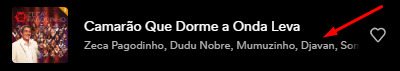

### Agrupando os artistas
<p>Para evitar dados repetidos, vamos agrupar os artistas em apenas uma música</p>

In [160]:
# O dicionário "agg_functions" contém um conjunto de funções de agregação que definem como cada coluna deve ser agregada.

# first guarda a primeira aparição

# .join concatena os valores dentro do grupo

agg_functions = {
    'nome_da_faixa': 'first',
    'nome_do_artista': ','.join,
    'generos_do_artista': 'first',
    'nome_do_album': 'first',
    'id_do_artista': ','.join,
    'popularidade': 'first',
    'duracao_ms': 'first',
    'explicita': 'first',
    'danceabilidade': 'first',
    'energia': 'first',
    'tonalidade': 'first',
    'volume': 'first',
    'modalidade': 'first',
    'fala': 'first',
    'acusticidade': 'first',
    'instrumentalidade': 'first',
    'aovivo': 'first',
    'positividade': 'first',
    'tempo': 'first',
    'assinatura_tempo': 'first',
    'duracao_min' : 'first'
}

In [161]:
# Agrupando o dataframe com base na coluna 'id_da_faixa' aplicando a função de agregação definida no dicionário

df_musicas_grouped = df_musicas.groupby('id_da_faixa').agg(agg_functions).reset_index()

df_musicas_grouped['id_da_faixa'].size

#Aplicando as músicas agrupadas para o dataframe
df_musicas = df_musicas_grouped

# Verificando a quantidade de linhas, houve redução de 1.981 linhas
df_musicas.shape

(12374, 22)

### Verificando os valores de algumas colunas

#### Coluna popularidade

A popularidade de uma música é um valor entre 0 e 100, sendo 100 o mais popular. A popularidade é calculada por algoritmo e é baseada no número total de reproduções que a faixa teve e quão recentes são essas reproduções. O valor altera periodicamente e esses valores devem ser considerados do mês de Junho de 2023.

In [162]:
df_musicas['popularidade'].describe()

count    12374.000000
mean        61.835138
std         14.844161
min          0.000000
25%         54.000000
50%         63.000000
75%         72.000000
max        100.000000
Name: popularidade, dtype: float64

In [163]:
# Configurando o boxplot
fig = go.Figure()
fig.add_trace(go.Box(y=df_musicas['popularidade'], 
                     boxmean='sd', 
                     marker_color='#00FF00', 
                     line_color='#000000', 
                     fillcolor='#00FF00'))

# Personalizando o layout do gráfico
fig.update_layout(
    title='Boxplot da Popularidade das Músicas',
    yaxis=dict(title='Popularidade'),
    xaxis=dict(title=''),
    showlegend=False,
    boxmode='group'
)

# Exibindo o gráfico
fig.show()

### Gerador de Gráfico Pizza

In [164]:
def gerarGraficoPizza(coluna):
        
    # Contagem dos valores da coluna 'tonalidade'
    contagem_tonalidade = df_musicas[coluna].value_counts()

    # Criação do gráfico de pizza
    fig = go.Figure(data=go.Pie(
        labels=contagem_tonalidade.index,
        values=contagem_tonalidade.values,
        hoverinfo='label+percent',
        textinfo='value+percent',
        textfont=dict(size=14),
        marker=dict(colors=px.colors.sequential.Turbo),
        pull=[0.03] * len(contagem_tonalidade.index)  # Ajuste o valor para alterar o espaçamento
        
    ))

    # Configurações de layout do gráfico
    fig.update_layout(
        title='Gráfico coluna: ' + coluna,
    )

    # Exibição do gráfico
    fig.show()

#### Coluna assinatura_tempo

Uma convenção de notação para especificar quantas batidas há em cada compasso.A fórmula de compasso varia de 3 a 7, indicando fórmulas de compasso de "3/4" a "7/4".
É uma métrica que varia de 0 a 5 onde 0 é o  mais proximo de 3/4 e 5 de 7/4

In [165]:
gerarGraficoPizza('assinatura_tempo')

#### Coluna modalidade

O tipo de escala da qual seu conteúdo melódico é derivado. Maior é representado por 1 e menor por 0

In [166]:
gerarGraficoPizza('modalidade')

#### Coluna explicita

Se a música possui ou não conteúdo explícito

In [167]:
gerarGraficoPizza('explicita')

#### Coluna Tonalidade

A tonalidade em que a faixa está.Por exemplo. 0 = C, 1 = C♯/D♭, 2 = D e assim por diante, se nenhuma chave for detectada, o valor é -1

In [168]:
gerarGraficoPizza('tonalidade')

## Classificando os dados

### Músicas por Artistas
<p>Devido ao modo de captura dos dados, o maior valor de músicas por artista será 20.</p>

In [169]:
df_tracksbyArtists = df_musicas[['id_do_artista','nome_do_artista']].value_counts()

print(df_musicas['id_do_artista'].unique().size, 'artistas no total.')

print(df_tracksbyArtists.mean())
display(df_tracksbyArtists)

2523 artistas no total.
4.9044787950852164


id_do_artista                                                         nome_do_artista                    
5M52tdBnJaKSvOpJGz8mfZ                                                Black Sabbath                          20
7bu3H8JO7d0UbMoVzbo70s                                                The Cure                               20
2ye2Wgw4gimLv2eAKyk1NB                                                Metallica                              19
2FXC3k01G6Gw61bmprjgqS                                                Hozier                                 18
3q7HBObVc0L8jNeTe5Gofh                                                50 Cent                                15
                                                                                                             ..
5he1UTofdFOcdbKqnLixko                                                Matogrosso & Mathias                    1
1Cs0zKBU1kc0i8ypK3B9ai,1Cs0zKBU1kc0i8ypK3B9ai,6AMd49uBDJfhf30Ak2QR5s  David Guetta,David Guetta,Coi Leray     

### Músicas com a maior popularidade

In [170]:
df_toptracks = df_musicas.sort_values('popularidade',ascending = False).head(100)

df_toptracks_view = df_toptracks[['id_da_faixa','nome_da_faixa', 'nome_do_artista', 'popularidade']].copy()
df_toptracks_view.reset_index()[['id_da_faixa','nome_da_faixa', 'nome_do_artista','popularidade']]

,id_da_faixa,nome_da_faixa,nome_do_artista,popularidade
0,6pD0ufEQq0xdHSsRbg9LBK,un x100to,Bad Bunny,100
1,2UW7JaomAMuX9pZrjVpHAU,La Bebe - Remix,Peso Pluma,99
2,7ro0hRteUMfnOioTFI5TG1,WHERE SHE GOES,Bad Bunny,99
3,7FbrGaHYVDmfr7KoLIZnQ7,Cupid - Twin Ver.,FIFTY FIFTY,98
4,1odExI7RdWc4BT515LTAwj,Daylight,"David Kushner,David Kushner",98
...,...,...,...,...
95,1dGr1c8CrMLDpV6mPbImSI,Lover,Taylor Swift,90
96,6GGtHZgBycCgGBUhZo81xe,Say Yes To Heaven,"Lana Del Rey,Lana Del Rey",90
97,3azJifCSqg9fRij2yKIbWz,The Color Violet,Tory Lanez,89
98,0FA4wrjDJvJTTU8AepZTup,Watch This - ARIZONATEARS Pluggnb Remix,"sped up nightcore,Lil Uzi Vert,ARIZONATEARS",89


### Artistas com a maior popularidade

In [171]:
# Agrupando o ID do artista e seu nome por popularidade
df_grouped_artist = df_musicas.groupby(['id_do_artista', 'nome_do_artista'])['popularidade'].sum().reset_index()

# Filtrando por maior popularidade
df_artist_sorted = df_grouped_artist.sort_values(by='popularidade', ascending=False)

# Display dos Top 10 Artistas e seus IDs
most_popular_artists = df_artist_sorted[['id_do_artista', 'nome_do_artista']].reset_index()[['id_do_artista', 'nome_do_artista']]
most_popular_artists.head(10)

,id_do_artista,nome_do_artista
0,2ye2Wgw4gimLv2eAKyk1NB,Metallica
1,7bu3H8JO7d0UbMoVzbo70s,The Cure
2,2FXC3k01G6Gw61bmprjgqS,Hozier
3,5M52tdBnJaKSvOpJGz8mfZ,Black Sabbath
4,3q7HBObVc0L8jNeTe5Gofh,50 Cent
5,6jJ0s89eD6GaHleKKya26X,Katy Perry
6,1Qp56T7n950O3EGMsSl81D,Ghost
7,4phGZZrJZRo4ElhRtViYdl,Jason Mraz
8,6eUKZXaKkcviH0Ku9w2n3V,Ed Sheeran
9,06HL4z0CvFAxyc27GXpf02,Taylor Swift


### Gêneros mais populares (baseado no gênero dos artistas)
<p>Nessa análise foi filtrado os artistas com gêneros [], poís estes são os que não possuem classificação de gênero pelo Spotify.</p>

In [172]:
# Agrupando os gêneros por popularidade
df_grouped_genres = df_musicas.groupby('generos_do_artista')['popularidade'].sum().reset_index()

# Filtrando gêneros não classificados
df_grouped_genres = df_grouped_genres[df_grouped_genres['generos_do_artista'] != '[]']

# Filtrando por maior popularidade
df_genres_sorted = df_grouped_genres.sort_values(by='popularidade', ascending=False)

# Display the most popular artists
most_popular_genres = df_genres_sorted[['generos_do_artista', 'popularidade']].reset_index()[['generos_do_artista', 'popularidade']]

# Display dos Top 100 Gêneros de artistas e suas popularidades
most_popular_genres.head(100)

,generos_do_artista,popularidade
0,['trap brasileiro'],12460
1,['pop'],11777
2,['brazilian gospel'],9773
3,"['dance pop', 'pop']",6723
4,['arrocha'],6019
...,...,...
95,"['dance pop', 'hip pop', 'r&b', 'urban contemp...",1110
96,"['alternative r&b', 'lgbtq+ hip hop']",1108
97,"['baroque pop', 'modern rock', 'neo mellow', '...",1102
98,['neo mellow'],1099


#### Separando os gêneros
<p>Separando os gêneros para verificar sua popularidade</p>

In [173]:
#Copiando o dataframe
df_generos_artistas = df_musicas.copy()

#Separando os Gêneros
df_generos_artistas['generos'] = df_generos_artistas['generos_do_artista'].str.strip('[]').str.split(',')

#Criando linhas indivíduais para cada gênero
df_generos_artistas_separado = df_generos_artistas.explode('generos')

In [174]:
# Agrupando os gêneros por popularidade
df_separated_genres = df_generos_artistas_separado.groupby('generos')['popularidade'].sum().reset_index()

df_separated_genres = df_separated_genres[df_separated_genres['generos'] != '']

# Filtrando por maior popularidade
df_separeted_genres_sorted = df_separated_genres.sort_values(by='popularidade', ascending=False)

# Display the most popular artists
most_popular_genres_separated = df_separeted_genres_sorted[['generos', 'popularidade']].reset_index()[['generos', 'popularidade']]

most_popular_genres_separated['generos'] = most_popular_genres_separated['generos'].str.replace("'", "").str.lstrip()
# Display dos Top 20 Gêneros de artistas e suas popularidades
most_popular_genres_separated = most_popular_genres_separated.groupby('generos')['popularidade'].sum().reset_index()
most_popular_genres_separated = most_popular_genres_separated.sort_values(by='popularidade', ascending=False)

most_popular_genres_separated

,generos,popularidade
526,pop,88764
603,rock,64402
573,rap,63658
326,hip hop,37922
646,sertanejo universitario,35686
...,...,...
254,experimental,0
160,christmas instrumental,0
138,cante flamenco,0
131,canadian folk,0


In [175]:
# Obter os top 20 gêneros por popularidade
top_20_generos = most_popular_genres_separated.groupby('generos')['popularidade'].mean().nlargest(20)

# Criar o gráfico de barras
fig = go.Figure(data=go.Bar(
    x=top_20_generos.index,
    y=top_20_generos.values,
    marker=dict(
        color='#1DB954',
        line=dict(
            color='#000000',
            width=1
        )
    )
))

# Personalizar a aparência
fig.update_layout(
    title='Top 20 Gêneros por Popularidade',
    xaxis=dict(
        title='Gêneros',
        tickangle=45,
        tickfont=dict(size=12)
    ),
    yaxis=dict(
        title='Popularidade',
        titlefont=dict(size=14),
        tickfont=dict(size=12)
    ),
    plot_bgcolor='#F9F9F9',
    bargap=0.1,
    bargroupgap=0.05
)

# Configurar estilos dos ticks
fig.update_xaxes(tickfont=dict(size=12))
fig.update_yaxes(tickfont=dict(size=12))

# Exibir o gráfico
fig.show()

### Músicas com as maiores durações

In [176]:
df_maiorDuracao = df_musicas[["nome_da_faixa","nome_do_artista", "duracao_min", "duracao_ms"]].sort_values(by="duracao_min",ascending=False)[:20]

df_maiorDuracao = df_maiorDuracao.reset_index()[['nome_da_faixa','nome_do_artista', 'duracao_min', 'duracao_ms']]
df_maiorDuracao = df_maiorDuracao.drop_duplicates(keep='last')
df_maiorDuracao

,nome_da_faixa,nome_do_artista,duracao_min,duracao_ms
0,Bloco Do Polly 2.0 Hitmado,Oh Polêmico,30:31,1831455
1,2015 Electro Club Mix,DJ Collins,23:39,5019840
2,Tu És o Centro (Ao Vivo),Frei Gilson,22:37,1357451
3,"Poetas no Topo 3.3, Pt. 1","Bob do Contra,Dk 47",19:07,1147406
4,Chato Pa Carai / Recaída / Vai Me Dando Corda ...,Vou Zuar,18:05,1085565
5,Seu Amor Me Persegue,AMÉM,17:15,1035895
6,Preciso de Ti - Ao Vivo,Diante do Trono,15:19,919733
7,Me Ama - Ao Vivo,Diante do Trono,14:35,875866
8,Shine On You Crazy Diamond (Pts. 1-5),"Pink Floyd,Pink Floyd",13:31,811077
9,Bloco Do Polly,Oh Polêmico,13:07,787725


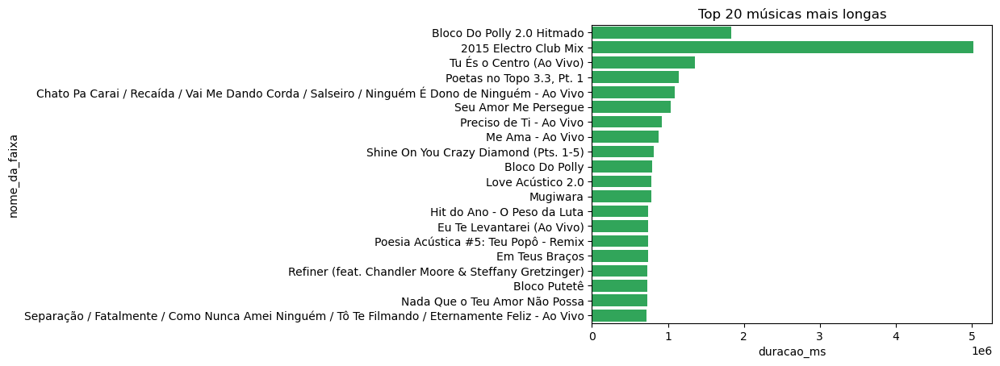

In [177]:
sns.barplot(x="duracao_ms", y="nome_da_faixa", data=df_maiorDuracao, color='#1DB954')
plt.title("Top 20 músicas mais longas")
plt.show()

### Músicas com as menores durações

In [178]:
df_menorDuracao = df_musicas[['nome_da_faixa','nome_do_artista', 'duracao_min', 'duracao_ms']].sort_values(by="duracao_min",ascending=True)[:20]

df_menorDuracao = df_menorDuracao.reset_index()[['nome_da_faixa','nome_do_artista', 'duracao_min', 'duracao_ms']]
df_menorDuracao = df_menorDuracao.drop_duplicates(keep='last')
df_menorDuracao

,nome_da_faixa,nome_do_artista,duracao_min,duracao_ms
0,Scalene,Sissy Spacek,00:07,7017
1,Steven Universe Future (Opening Theme) / Title...,Rebecca Sugar,00:30,30985
2,Grey Skies,Rain Fruits,00:31,31000
3,Rainforest,Rain Fruits,00:31,31000
4,Rain Outside,Rain Fruits,00:31,31000
5,Cozy Rain Day,Rain Fruits,00:31,31000
6,Rainy Summer Days,Rain Fruits,00:31,31000
7,Light Rainfall on the Window,Rain Fruits,00:31,31000
8,Rain Sounds,Rain Fruits,00:31,31000
9,Calming Thunderstorm,Rain Fruits,00:31,31000


### Músicas com a maior energia
<p>A energia é uma medida de 0,0 a 1,0 e representa uma medida perceptiva de intensidade e atividade. Normalmente, as faixas energéticas parecem rápidas, altas e barulhentas, podemos enxergar 'falhas' nas classificações ao encontrar "músicas" que são apenas ruídos no topo da lista.</p>

In [179]:
df_maiorEnergia = df_musicas[["nome_da_faixa","nome_do_artista","energia", "volume"]].sort_values(by="energia",ascending=False)[:20]

df_maiorEnergia = df_maiorEnergia.reset_index()[['nome_da_faixa', 'nome_do_artista', 'energia', 'volume']]
df_maiorEnergia = df_maiorEnergia.drop_duplicates(keep='last')
df_maiorEnergia

,nome_da_faixa,nome_do_artista,energia,volume
0,Scalene,Sissy Spacek,1.000,5.759
1,"White Noise Rain(Loopable,No fade)",Ocean Sounds,1.000,-14.085
2,Tropical Forests,Ocean Sounds,1.000,-22.878
3,"Barulho de Chuva para Dormir Profundamente, Pt...",Barulho De Chuva,1.000,-23.480
4,Grey Skies,Rain Fruits,1.000,-26.291
5,Rolling Forest Rains,Ocean Sounds,1.000,-11.653
6,Rain Sounds,Rain Fruits,1.000,-26.503
7,Quiet Rain Sounds,Ocean Sounds,1.000,-12.228
8,Rainforest,Rain Fruits,1.000,-26.286
9,Light Rainfall on the Window,Rain Fruits,0.999,-27.916


In [180]:
import IPython as ip

ip.display.Audio("antares.mp3")

![Cat Shakira Dance](https://media.giphy.com/media/blSTtZehjAZ8I/giphy.gif)

### Músicas com a menor energia
<p>Aqui também encontramos "músicas" de apenas ruídos no topo, porêm agora são ruídos brancos.</p>

In [181]:
df_menorEnergia = df_musicas[["nome_da_faixa","nome_do_artista","energia", "volume"]].sort_values(by="energia",ascending=True)[:20]

df_menorEnergia = df_menorEnergia.reset_index()[['nome_da_faixa', 'nome_do_artista', 'energia', 'volume']]
df_menorEnergia = df_menorEnergia.drop_duplicates(keep='last')
df_menorEnergia

,nome_da_faixa,nome_do_artista,energia,volume
0,Ruido Branco,Medicina Relaxante,0.000019,-9.954
1,Ruido Branco Bebe,Medicina Relaxante,0.000019,-9.879
2,Beach Waves and Soothing Brown Noise,Ocean Sounds,0.000252,-17.746
3,Clearing the Mind,Nana Bebê,0.000690,-18.860
4,Piano Baby Lullabies for Baby Sleep,Baby Lullaby Academy,0.001690,-43.820
5,Little Stars Shining in the Sky,Nana Bebê,0.002150,-18.833
6,Luminous,Ludovico Einaudi,0.002290,-34.977
7,"Piano Sonata No. 14 in C-Sharp Minor, Op. 27 N...",Ludwig van Beethoven,0.002450,-41.530
8,Estrellita Dónde Estás,"Wolfgang Amadeus Mozart,Wolfgang Amadeus Mozart",0.002600,-29.033
9,"Prélude in E minor, Op. 28, No. 4",Frédéric Chopin,0.002690,-32.970


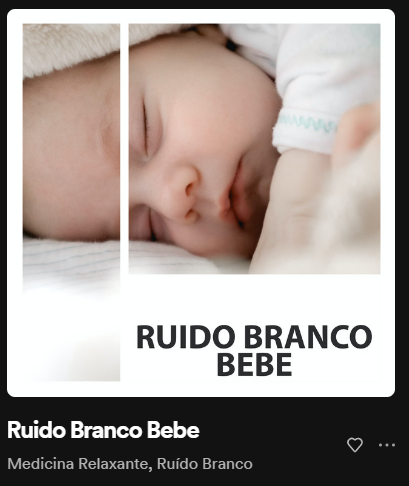

### Músicas mais dançaveis
<p>A capacidade de dança descreve o quão adequada uma música é para dançar com base em uma combinação de elementos musicais, incluindo andamento, estabilidade do ritmo, força da batida e regularidade geral.</p>

In [182]:
df_maisDanca = df_musicas[["nome_da_faixa","nome_do_artista","danceabilidade"]].sort_values(by="danceabilidade",ascending=False)[:5]

df_maisDanca = df_maisDanca.reset_index()[['nome_da_faixa', 'nome_do_artista', 'danceabilidade']]
df_maisDanca = df_maisDanca.drop_duplicates(keep='last')
df_maisDanca

,nome_da_faixa,nome_do_artista,danceabilidade
0,Botadinha Saliente,MC Rogerinho,0.985
1,Conceited,Flo Milli,0.984
2,Red Dot,"Yunk Vino,Caio Passos,Labbel Rec",0.982
3,Que Se Foda a Porra Toda (feat. Mc Mr. Bim),Dj Tk,0.981
4,Dancing in My Room,347aidan,0.980


### Músicas menos dançaveis

In [183]:
df_menosDanca = df_musicas[["nome_da_faixa","nome_do_artista","danceabilidade"]].sort_values(by="danceabilidade",ascending=True)[:5]

df_menosDanca = df_menosDanca.reset_index()[['nome_da_faixa', 'nome_do_artista', 'danceabilidade']]
df_menosDanca = df_menosDanca.drop_duplicates(keep='last')
df_menosDanca

,nome_da_faixa,nome_do_artista,danceabilidade
0,Beach Waves and Soothing Brown Noise,Ocean Sounds,0.0
1,Ruido Branco,Medicina Relaxante,0.0
2,Ruido Branco Bebe,Medicina Relaxante,0.0
3,Scalene,Sissy Spacek,0.0
4,Waiting Too Long,Hippie Sabotage,0.0


### Músicas com mais fala

In [184]:
df_maisFala = df_musicas[["nome_da_faixa","nome_do_artista","fala"]].sort_values(by="fala",ascending=False)[:5]

df_maisFala = df_maisFala.reset_index()[['nome_da_faixa', 'nome_do_artista', 'fala']]
df_maisFala = df_maisFala.drop_duplicates(keep='last')
df_maisFala

,nome_da_faixa,nome_do_artista,fala
0,Tá Possuida Cadela,Dj LK da Escócia,0.945
1,Brush Your Teeth,Raffi,0.934
2,Nômade IV,"Jean Tassy,Yago Oproprio",0.930
3,Pede pra Botar Que Eu Boto,DJ Ws da Igrejinha,0.902
4,De Treta Em Treta,MC Caja,0.899


### Músicas com menos fala

In [185]:
df_menosFala = df_musicas[["nome_da_faixa","nome_do_artista","fala"]].sort_values(by="fala",ascending=True)[:5]

df_menosFala = df_menosFala.reset_index()[['nome_da_faixa', 'nome_do_artista', 'fala']]
df_menosFala = df_menosFala.drop_duplicates(keep='last')
df_menosFala

,nome_da_faixa,nome_do_artista,fala
0,Waiting Too Long,Hippie Sabotage,0.0
1,Beach Waves and Soothing Brown Noise,Ocean Sounds,0.0
2,Scalene,Sissy Spacek,0.0
3,Ruido Branco,Medicina Relaxante,0.0
4,Ruido Branco Bebe,Medicina Relaxante,0.0


### Músicas com maior acusticidade

In [186]:
df_maisAcusticidade = df_musicas[["nome_da_faixa","nome_do_artista","acusticidade"]].sort_values(by="acusticidade",ascending=False)[:5]

df_maisAcusticidade = df_maisAcusticidade.reset_index()[['nome_da_faixa', 'nome_do_artista', 'acusticidade']]
df_maisAcusticidade = df_maisAcusticidade.drop_duplicates(keep='last')
df_maisAcusticidade

,nome_da_faixa,nome_do_artista,acusticidade
0,"Piano Sonata No. 14 in C-Sharp Minor, Op. 27 N...",Ludwig van Beethoven,0.995
1,Brilha Brilha Estrelinha (Piano Instrumental),Nana Bebê,0.995
2,"Prélude in E minor, Op. 28, No. 4",Frédéric Chopin,0.995
3,Clearing the Mind,Nana Bebê,0.995
4,I Miss You,Ozymandias,0.995


### Músicas com menor acusticidade

In [187]:
df_menorAcusticidade = df_musicas[["nome_da_faixa","nome_do_artista","acusticidade"]].sort_values(by="acusticidade",ascending=True)[:5]

df_menorAcusticidade = df_menorAcusticidade.reset_index()[['nome_da_faixa', 'nome_do_artista', 'acusticidade']]
df_menorAcusticidade = df_menorAcusticidade.drop_duplicates(keep='last')
df_menorAcusticidade

,nome_da_faixa,nome_do_artista,acusticidade
0,Ruido Branco Bebe,Medicina Relaxante,0.000000
1,Ruido Branco,Medicina Relaxante,0.000000
2,Sex Type Thing - 2017 Remaster,Stone Temple Pilots,0.000001
3,Mouth for War,Pantera,0.000004
4,Soft,Motionless In White,0.000005


### Músicas com maior instrumentalidade

In [188]:
df_maiorInstrumentalidade = df_musicas[["nome_da_faixa","nome_do_artista","instrumentalidade"]].sort_values(by="instrumentalidade",ascending=False)[:5]

df_maiorInstrumentalidade = df_maiorInstrumentalidade.reset_index()[['nome_da_faixa', 'nome_do_artista', 'instrumentalidade']]
df_maiorInstrumentalidade = df_maiorInstrumentalidade.drop_duplicates(keep='last')
df_maiorInstrumentalidade

,nome_da_faixa,nome_do_artista,instrumentalidade
0,Bedtime White Noise Melody,Sleeping Tortoise,0.999
1,Hair Dryer [Non-Stationary],Medicina Relaxante,0.994
2,Brahms Lullaby and White Noise Ocean Waves,Baby Lullaby Academy,0.993
3,Soothing Baby Sleep,Sleeping Tortoise,0.992
4,528 Hz Bring Positive Transformation,"Miracle Tones,Solfeggio Healing Frequencies MT",0.992


### Músicas com menor instrumentalidade

In [189]:
df_menorInstrumentalidade = df_musicas[["nome_da_faixa","nome_do_artista","instrumentalidade"]].sort_values(by="instrumentalidade",ascending=True)[:5]

df_menorInstrumentalidade = df_menorInstrumentalidade.reset_index()[['nome_da_faixa', 'nome_do_artista', 'instrumentalidade']]
df_menorInstrumentalidade = df_menorInstrumentalidade.drop_duplicates(keep='last')
df_menorInstrumentalidade

,nome_da_faixa,nome_do_artista,instrumentalidade
0,Don't Forget That,Sha EK,0.0
1,"Free Fallin' - Live at the Nokia Theatre, Los ...",John Mayer,0.0
2,Singles You Up,Jordan Davis,0.0
3,Ni**as In Paris,"JAY-Z,Kanye West,Kanye West,JAY-Z",0.0
4,Aquarela,Toquinho,0.0


### Músicas com maior indício de ser ao vivo

In [190]:
df_maisAovivo = df_musicas[["nome_da_faixa","nome_do_artista","aovivo"]].sort_values(by="aovivo",ascending=False)[:5]

df_maisAovivo = df_maisAovivo.reset_index()[['nome_da_faixa', 'nome_do_artista', 'aovivo']]
df_maisAovivo = df_maisAovivo.drop_duplicates(keep='last')
df_maisAovivo

,nome_da_faixa,nome_do_artista,aovivo
0,Lanterna dos Afogados - Ao Vivo,Maria Gadú,0.993
1,Quando Fui Chuva / Fim de Tarde / Palpite - Ao...,Marvvila,0.990
2,100 Likes - Ao Vivo,Belo,0.989
3,Sobrenome - Ao vivo,Vitinho,0.988
4,Agora Perdeu,Bom Gosto,0.988


### Músicas com menor indício de ser ao vivo

In [191]:
df_menosAovivo = df_musicas[["nome_da_faixa","nome_do_artista","aovivo"]].sort_values(by="aovivo",ascending=True)[:5]

df_menosAovivo = df_menosAovivo.reset_index()[['nome_da_faixa', 'nome_do_artista', 'aovivo']]
df_menosAovivo = df_menosAovivo.drop_duplicates(keep='last')
df_menosAovivo

,nome_da_faixa,nome_do_artista,aovivo
0,Scalene,Sissy Spacek,0.0000
1,Ruido Branco Bebe,Medicina Relaxante,0.0000
2,Ruido Branco,Medicina Relaxante,0.0000
3,Ants Marching,Dave Matthews Band,0.0157
4,Bonetrousle,Toby Fox,0.0200


### Músicas com maior positividade
<p>Faixas com alta positividade soam mais positivas, por exemplo, feliz, alegre, eufórica, enquanto faixas com baixa positividade soam mais negativas, por exemplo, triste, deprimido, zangado.</p>

In [192]:
df_maiorPositividade = df_musicas[["nome_da_faixa","nome_do_artista","positividade"]].sort_values(by="positividade",ascending=False)[:5]

df_maiorPositividade = df_maiorPositividade.reset_index()[['nome_da_faixa', 'nome_do_artista', 'positividade']]
df_maiorPositividade = df_maiorPositividade.drop_duplicates(keep='last')
df_maiorPositividade

,nome_da_faixa,nome_do_artista,positividade
0,Spider Dance,Toby Fox,0.993
1,What a Fool Believes,The Doobie Brothers,0.985
2,Sergio el Bailador,Bronco,0.984
3,Mordidinha Safada,Mc Daniel,0.981
4,Ryd,Steve Lacy,0.980


### Músicas com menor positividade

In [193]:
df_menorPositividade = df_musicas[["nome_da_faixa","nome_do_artista","positividade"]].sort_values(by="positividade",ascending=True)[:5]

df_menorPositividade = df_menorPositividade.reset_index()[['nome_da_faixa', 'nome_do_artista', 'positividade']]
df_menorPositividade = df_menorPositividade.drop_duplicates(keep='last')
df_menorPositividade

,nome_da_faixa,nome_do_artista,positividade
0,Waiting Too Long,Hippie Sabotage,0.0
1,Ruido Branco Bebe,Medicina Relaxante,0.0
2,Ruido Branco,Medicina Relaxante,0.0
3,Gentle Piano Baby Sleep,Sleeping Tortoise,0.0
4,Clearing the Mind,Nana Bebê,0.0


### Músicas com maior tempo
<p>O andamento geral estimado de uma faixa em batidas por minuto (BPM). Na terminologia musical, tempo é a velocidade ou ritmo de uma determinada peça e deriva diretamente da duração média da batida.</p>

In [194]:
df_maiorTempo = df_musicas[["nome_da_faixa","nome_do_artista","tempo"]].sort_values(by="tempo",ascending=False)[:5]

df_maiorTempo = df_maiorTempo.reset_index()[['nome_da_faixa', 'nome_do_artista', 'tempo']]
df_maiorTempo = df_maiorTempo.drop_duplicates(keep='last')
df_maiorTempo

,nome_da_faixa,nome_do_artista,tempo
0,Mama Cry,YNW Melly,220.099
1,Queimando Tudo,Planet Hemp,215.126
2,Soli (feat. Tiago PZK & Rvssian),Rvssian,214.047
3,snowfall (Sped Up),Øneheart,213.503
4,Pull up to Mi Bumper,Konshens,211.958


### Músicas com menor tempo

In [195]:
df_menorTempo = df_musicas[["nome_da_faixa","nome_do_artista","tempo"]].sort_values(by="tempo",ascending=True)[:5]

df_menorTempo = df_menorTempo.reset_index()[['nome_da_faixa', 'nome_do_artista', 'tempo']]
df_menorTempo = df_menorTempo.drop_duplicates(keep='last')
df_menorTempo

,nome_da_faixa,nome_do_artista,tempo
0,Scalene,Sissy Spacek,0.0
1,Waiting Too Long,Hippie Sabotage,0.0
2,Ruido Branco Bebe,Medicina Relaxante,0.0
3,Ruido Branco,Medicina Relaxante,0.0
4,Beach Waves and Soothing Brown Noise,Ocean Sounds,0.0


## Correlação dos dados

Verificar a correlação de dados na análise exploratória é importante porque ajuda a entender a relação entre as variáveis em um conjunto de dados. A correlação é uma medida estatística que indica a força e a direção da relação entre duas variáveis.

Ao examinar a correlação, podemos determinar se as variáveis estão positivamente correlacionadas (ou seja, quando uma aumenta, a outra também aumenta), negativamente correlacionadas (quando uma aumenta, a outra diminui) ou não correlacionadas (quando não há relação aparente entre as variáveis).

Além disso, a correlação também ajuda a identificar possíveis problemas com o conjunto de dados, como a presença de outliers ou variáveis altamente correlacionadas, o que pode afetar a precisão dos modelos de análise de dados.

In [196]:
df_corr = df_musicas.corr(method="pearson")

df_corr

C:\Users\Administrator\AppData\Local\Temp\ipykernel_2772\1375236007.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,popularidade,duracao_ms,explicita,danceabilidade,energia,tonalidade,volume,modalidade,fala,acusticidade,instrumentalidade,aovivo,positividade,tempo,assinatura_tempo
popularidade,1.000000,0.005504,-0.013079,-0.007017,0.055482,-0.013382,0.077712,0.010890,-0.094078,-0.152582,-0.093749,-0.070366,-0.034625,-0.002141,-0.030535
duracao_ms,0.005504,1.000000,-0.101161,-0.209810,-0.012467,-0.016652,-0.027988,0.032800,-0.087626,-0.030626,-0.039895,0.021670,-0.143576,-0.006743,-0.008393
explicita,-0.013079,-0.101161,1.000000,0.322957,-0.005452,-0.001458,0.126554,-0.121407,0.470458,-0.130529,-0.089122,-0.100774,-0.028233,-0.009798,0.087348
danceabilidade,-0.007017,-0.209810,0.322957,1.000000,0.053877,0.019448,0.235164,-0.122874,0.276126,-0.131306,-0.159054,-0.177350,0.387088,-0.069671,0.157985
energia,0.055482,-0.012467,-0.005452,0.053877,1.000000,0.029912,0.674005,-0.048113,-0.018252,-0.517556,-0.142405,0.212224,0.320802,0.160388,0.110122
tonalidade,-0.013382,-0.016652,-0.001458,0.019448,0.029912,1.000000,0.015622,-0.114244,0.015829,-0.010450,0.002097,-0.005460,0.038804,0.005002,0.001037
volume,0.077712,-0.027988,0.126554,0.235164,0.674005,0.015622,1.000000,-0.053288,0.069149,-0.388169,-0.403185,0.063333,0.263773,0.117830,0.112116
modalidade,0.010890,0.032800,-0.121407,-0.122874,-0.048113,-0.114244,-0.053288,1.000000,-0.128375,0.050541,0.010894,0.045338,-0.043377,0.015783,-0.039721
fala,-0.094078,-0.087626,0.470458,0.276126,-0.018252,0.015829,0.069149,-0.128375,1.000000,-0.035158,-0.100517,-0.067629,0.076480,0.012061,0.127302
acusticidade,-0.152582,-0.030626,-0.130529,-0.131306,-0.517556,-0.010450,-0.388169,0.050541,-0.035158,1.000000,0.122113,0.036965,-0.039221,-0.086752,-0.094669


In [197]:
# Criação do gráfico de heatmap
fig = go.Figure(data=go.Heatmap(
                   z=df_corr.values,
                   x=df_corr.columns,
                   y=df_corr.index,
                   colorscale='Greens',
                   colorbar=dict(title='Correlação'),
                   text=df_corr.values,  # Adiciona os valores numéricos
                   hovertemplate='Valor: %{text:.1f}'  # Formatação do tooltip
))

# Configurações de layout do gráfico
fig.update_layout(
    title='Correlação entre as variáveis',
    xaxis=dict(title='Variáveis'),
    yaxis=dict(title='Variáveis'),
    width=800,
    height=700
)

# Exibição do gráfico
fig.show()

#### Correlação entre acusticidade e energia

Primeiro extraímos os valores de x e y do DataFrame df_musicas. Em seguida, usamos a função np.polyfit() para calcular os coeficientes da linha linear que melhor se ajustam aos pontos de dados. Em seguida, criamos uma função de linha usando np.poly1d(). Por fim, usamos plt.plot() para traçar a linha usando os valores de x e a função de linha.

In [245]:
# Plotando o gráfico de dispersão
fig = px.scatter(df_musicas, x='acusticidade', y='energia', trendline='ols', trendline_color_override="red")

# Personalizando o gráfico
fig.update_traces(marker=dict(color='#1DB954'))

# Exibindo o gráfico
fig.show()

#### Correlação entre energia e volume

In [246]:
# Plotando o gráfico de dispersão
fig = px.scatter(df_musicas, x='volume', y='energia', trendline='ols', trendline_color_override="red")

# Personalizando o gráfico
fig.update_traces(marker=dict(color='#1DB954'))

# Exibindo o gráfico
fig.show()

# Dataframe dos Usuários

In [200]:
df_usuarios.head()

,id_da_faixa,nome_da_faixa,nome_do_artista,generos_do_artista,nome_do_album,id_do_artista,popularidade,duracao_ms,explicita,danceabilidade,...,modalidade,fala,acusticidade,instrumentalidade,aovivo,positividade,tempo,assinatura_tempo,album_img,usuário
0,7wdwIaXUuzlu1grzWMFRJm,Mary On A Cross,Ghost,"['hard rock', 'metal']",[MESSAGE FROM THE CLERGY],1Qp56T7n950O3EGMsSl81D,77,244804,False,0.467,...,1,0.0451,0.000187,0.000493,0.1050,0.554,130.027,4,https://i.scdn.co/image/ab67616d00001e02f7dbc5...,Anne
1,6I3mqTwhRpn34SLVafSH7G,Ghost,Justin Bieber,"['canadian pop', 'pop']",Justice,1uNFoZAHBGtllmzznpCI3s,89,153190,False,0.601,...,1,0.0478,0.185000,0.000029,0.4150,0.441,153.960,4,https://i.scdn.co/image/ab67616d00001e02e6f407...,Anne
2,1daDRI9ahBonbWD8YcxOIB,Angels Like You,Miley Cyrus,['pop'],Plastic Hearts,5YGY8feqx7naU7z4HrwZM6,94,196453,False,0.672,...,1,0.0313,0.098100,0.000000,0.1000,0.494,121.981,4,https://i.scdn.co/image/ab67616d00001e028cffb7...,Anne
3,6jugu0rJWQUxwP6YekuYh7,Miley Cyrus,Ying Yang Twins,"['atl hip hop', 'crunk', 'dirty south rap', 'o...",Twerking Hitz,44PA0rCQXikgOWbfY7Fq7m,0,216659,False,0.762,...,0,0.0781,0.007310,0.000182,0.2180,0.402,98.060,4,https://i.scdn.co/image/ab67616d00001e02682ec1...,Anne
4,66tHO11PSLP7u25A6XM4iR,"Love, Love",Cedarmont Kids,['vbs'],Songs Of Praise,0MCU2OpgnSB7rm5UPUMHgt,8,142960,False,0.577,...,0,0.0310,0.898000,0.000000,0.0794,0.491,129.640,4,https://i.scdn.co/image/ab67616d00001e0221fd70...,Anne


## Primeiras análises

### Músicas que mais se repetiram

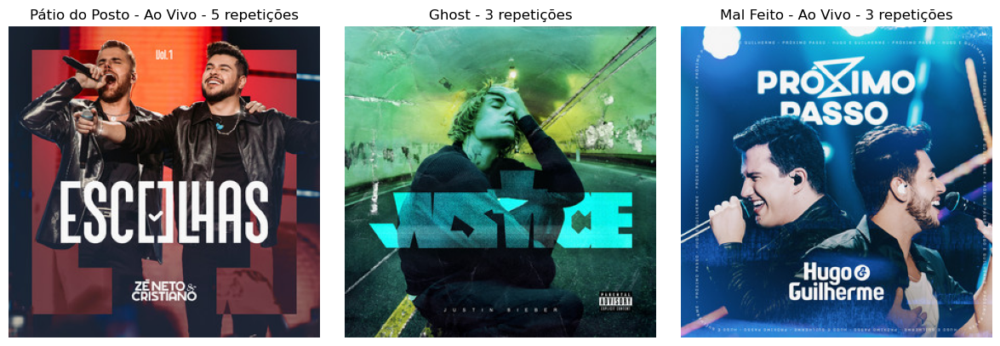

In [201]:
df_musicas_repetidas = df_usuarios[['id_da_faixa','nome_da_faixa', 'nome_do_artista','album_img']].value_counts()
df_musicas_repetidas = pd.DataFrame(df_musicas_repetidas.head(3).reset_index())
df_musicas_repetidas.rename(columns={0: 'n_musicas'}, inplace=True)

# Criar a figura e as subplots
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

# Percorrer o dataframe e exibir as imagens com o número de repetições
for i, (index, row) in enumerate(df_musicas_repetidas.iterrows()):
    response = requests.get(row['album_img'])
    imagem = Image.open(BytesIO(response.content))
    
    
    # Exibir a imagem redimensionada com o número de repetições na subplot atual
    axs[i].imshow(imagem)
    axs[i].set_title(f'{row["nome_da_faixa"]} - {row["n_musicas"]} repetições')
    axs[i].axis('off')

# Ajustar o espaçamento entre as subplots
plt.tight_layout()

# Mostrar todas as imagens
plt.show()

### Gêneros mais escutados

In [202]:
#Copiando o dataframe
df_generos_usuarios = df_usuarios.copy()

#Separando os Gêneros
df_generos_usuarios['generos'] = df_generos_usuarios['generos_do_artista'].str.strip('[]').str.split(',')

#Criando linhas indivíduais para cada gênero
df_generos_usuarios_separado = df_generos_usuarios.explode('generos')

# Filtrando gêneros não classificados
df_generos_usuarios_separado = df_generos_usuarios_separado[df_generos_usuarios_separado['generos'] != '']

In [203]:
#Contando a aparição dos gêneros
df_generos_usuarios_separado['generos'] = df_generos_usuarios_separado['generos'].str.replace("'", "").str.lstrip()

top_generos_count = df_generos_usuarios_separado['generos'].value_counts()

top_generos_count

pop                        94
sertanejo universitario    81
arrocha                    69
agronejo                   67
sertanejo                  54
                           ..
cante flamenco              1
flamenco                    1
rumba                       1
funk melody                 1
dark r&b                    1
Name: generos, Length: 380, dtype: int64

In [204]:
from wordcloud import WordCloud
# Definindo a frequência dos generos
frequencia_generos = top_generos_count

# Criando o dicionário de frequências
frequencias = frequencia_generos.to_dict()

# Definindo a cor de fundo
cor_fundo = 'white' 

# Definindo o fator de escala relativo, valor menor que 1 para tornar as palavras mais frequentes mais escuras
fator_escala_relativo = 0.6

# Criando o Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color=cor_fundo, collocations=False, relative_scaling=fator_escala_relativo).generate_from_frequencies(frequencias)

# Plotando o Word Cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

ModuleNotFoundError: No module named 'wordcloud'

## Análise dos Usuários

### Média das músicas dos usuários
Pegamos apenas os valores numéricos e fizemos uma média de todos os usuários com nome igual 
para ter apenas uma linha de cada usuário com os dados sendo uma média das músicas executadas por ele, 
gerando um status exclusivo para cada um.<br>
<br>
Transformamos a coluna explicita de booleana (true ou false) para (1 ou 0)

In [205]:
# Colunas a serem convertidas
categorical_columns = ['explicita']

# Codificação de rótulos
label_encoder = LabelEncoder()
for column in categorical_columns:
    df_usuarios[column] = label_encoder.fit_transform(df_usuarios[column])

Para fazer a média dos valores das músicas dos usuários, tiramos tudo que não for numérico, como nome da faixa, nome do artista, etc.

In [207]:
# Selecionar apenas as colunas relevantes
columns = ['popularidade', 'duracao_ms', 'explicita',
           'modalidade', 'fala', 'acusticidade', 'instrumentalidade', 'aovivo',
           'positividade', 'tempo', 'assinatura_tempo', 'usuário']
df_relevantes = df_usuarios[columns]

Apenas os valores numéricos

In [208]:
df_relevantes.head(3)

,popularidade,duracao_ms,explicita,modalidade,fala,acusticidade,instrumentalidade,aovivo,positividade,tempo,assinatura_tempo,usuário
0,77,244804,0,1,0.0451,0.000187,0.000493,0.105,0.554,130.027,4,Anne
1,89,153190,0,1,0.0478,0.185000,0.000029,0.415,0.441,153.960,4,Anne
2,94,196453,0,1,0.0313,0.098100,0.000000,0.100,0.494,121.981,4,Anne


Agrupando por usuário e realizando a média

In [209]:
# Calcular a média das colunas para cada usuário
df_usuarios_media = df_relevantes.groupby('usuário').mean()

#### Agora temos os usuários e suas médias de gostos

In [210]:
df_usuarios_media.head(28)

,popularidade,duracao_ms,explicita,modalidade,fala,acusticidade,instrumentalidade,aovivo,positividade,tempo,assinatura_tempo
usuário,,,,,,,,,,,
Anne,49.750000,203348.400000,0.050000,0.750000,0.059850,0.355385,5.718545e-02,0.208040,0.495950,124.949850,3.900000
Antonio,42.350000,207537.050000,0.150000,0.600000,0.063170,0.244122,1.396568e-01,0.216475,0.565000,124.251750,4.050000
Antonio2,38.150000,219017.450000,0.100000,0.600000,0.101450,0.302018,1.268165e-01,0.190335,0.474285,126.850200,4.050000
Caio,68.100000,205224.750000,0.150000,0.500000,0.151845,0.250630,6.203000e-05,0.153695,0.552800,124.071700,4.050000
CaioV,38.950000,226138.300000,0.250000,0.700000,0.086305,0.385835,1.788513e-01,0.268410,0.443225,127.654850,4.100000
Catarine,54.100000,217048.550000,0.050000,0.500000,0.086210,0.162001,8.031935e-02,0.228240,0.381235,128.069850,3.950000
Celio,77.300000,186325.400000,0.400000,0.650000,0.106195,0.321270,1.834825e-03,0.337435,0.674300,136.756350,4.050000
Davi,66.250000,198558.450000,0.200000,0.450000,0.058575,0.295231,1.632605e-01,0.181610,0.347870,129.294900,4.000000
Enrico,7.133333,274415.466667,0.000000,0.733333,0.064327,0.811033,5.261153e-01,0.146887,0.369433,118.745200,3.466667


#### Com os dados de cada usuário podemos partir para algumas análises

### Análise do Grupo de usuários

#### Popularidade

A coluna popularidade é um valor entre 0 e 100 de uma música, sendo 100 o mais popular.
A partir da média da popularidade das músicas ouvidas pelo usuário, 
temos um valor do quanto cada usuário segue a tendência.<br>
<br>
Plot da coluna popularidade do Data Frame de usuários ordenados de forma decrescente

In [211]:
mais_padrao = df_usuarios_media.groupby('usuário')['popularidade'].mean().nlargest(28)

fig = go.Figure(data=go.Bar(x=mais_padrao.index, y=mais_padrao.values, marker_color='#1DB954'))

fig.update_layout(
    title='Usuário mais padrão',
    xaxis=dict(title='Usuários', tickangle=90),
    yaxis=dict(title='Popularidade'),
    height=500,
    width=900
)

fig.show()

Podemos ver que Célio, Pedro e Gabi escutam por sua maioria músicas consideradas populares pelo Spotify enquanto Enrico por escutar apenas músicas clássicas tem um valor bem baixo<br>
<br>
Como funciona a popularidade?

A popularidade é calculada por algoritmo e é baseada, na maioria, no número total de reproduções que a faixa teve e quão recentes são essas reproduções.
De modo geral, as músicas que estão sendo muito tocadas agora terão uma popularidade maior do que as músicas que eram muito tocadas no passado.


#### Positividade

A coluna positividade é uma medida de 0,0 a 1,0 que descreve a positividade musical transmitida por uma faixa. Faixas com alta positividade soam mais positivas (feliz, alegre, eufórica), enquanto faixas com baixa positividade soam mais negativas (triste, deprimido, zangado).
<br><br>
Plot da coluna positividade do data frame de usuários ordenado de forma decrescente

In [212]:
mais_positivo = df_usuarios_media.groupby('usuário')['positividade'].mean().nlargest(28)

fig = go.Figure(data=go.Bar(x=mais_positivo.index, y=mais_positivo.values, marker_color='#1DB954'))

fig.update_layout(
    title='Usuário mais positivo',
    xaxis=dict(title='Usuários', tickangle=90),
    yaxis=dict(title='Positividade das musicas'),
    height=500,
    width=800
)

fig.show()

Podemos ver a popularidade da música não depende dela ser positiva visto que agora, Pedro e Célio estão distantes no gráfico.

#### Instrumentalidade

A coluna instrumentalidade prevê se uma faixa não contém vocais.
Quanto mais próximo o valor da instrumentalidade estiver de 1,0, 
maior a probabilidade da faixa não conter nenhum conteúdo vocal. 
<br><br>
Plot da coluna instrumentalidade do Data Frame de usuários ordenados de forma decrescente

In [213]:
mais_instrumental = df_usuarios_media.groupby('usuário')['instrumentalidade'].mean().nlargest(28)

fig = go.Figure(data=go.Bar(x=mais_instrumental.index, y=mais_instrumental.values, marker_color='#1DB954'))

fig.update_layout(
    title='Usuario mais instrumental',
    xaxis=dict(title='Usuários', tickangle=90),
    yaxis=dict(title='Instrumentalidade das musicas'),
    height=500,
    width=800
)

fig.show()

Podemos ver que Enrico por escutar apenas músicas clássicas tem um valor superior nessa análise. 

#### Expliciticidade

Se a música possui ou não conteúdo explícito (1 ou 0)<br>
<br>
Plot da coluna explicita do Data Frame de usuários ordenados de forma decrescente

In [214]:
mais_explicito = df_usuarios_media.groupby('usuário')['explicita'].mean().nlargest(28)

fig = go.Figure(data=go.Bar(x=mais_explicito.index, y=mais_explicito.values, marker_color='#1DB954'))

fig.update_layout(
    title='Usuário com musicas mais explicitas',
    xaxis=dict(title='Usuários', tickangle=90),
    yaxis=dict(title='Musicas mais explicitas'),
    height=500,
    width=800
)

fig.show()

Podemos ver que Maria Eduarda e Célio escutam bastante músicas com conteúdo explícito

#### Frequência de Fala

Detecta a presença de falas em uma faixa. 
Quanto mais frequente for à fala mais próximo de 1,0 será o valor do atributo.<br>
<br>
Plot da coluna fala do data frame de usuários ordenado de forma decrescente

In [215]:
mais_fala = df_usuarios_media.groupby('usuário')['fala'].mean().nlargest(28)

fig = go.Figure(data=go.Bar(x=mais_fala.index, y=mais_fala.values, marker_color='#1DB954'))

fig.update_layout(
    title='Escuta musicas com mais falas',
    xaxis=dict(title='Usuários', tickangle=90),
    yaxis=dict(title='Musicas com mais falas'),
    height=500,
    width=800
)

fig.show()

Podemos ver que Caio e Lilian escutam mais músicas com alta frequência de fala, como poesia, rap e afins.

### Encontrando grupos parecidos com KNN (TESTE PEDRO)

Divisão dos usuários em 5 grupos que tenham os valores de todas as colunas proximos 

Biblioteca necessária 

In [216]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

Para essa análise desconsideramos o tempo das músicas

In [217]:
# Selecionar apenas as colunas relevantes
columns = ['popularidade', 'explicita', 'modalidade', 'fala',
           'acusticidade', 'instrumentalidade', 'aovivo', 'positividade',]
df = df_usuarios_media[columns]

In [218]:
df.head(3)

,popularidade,explicita,modalidade,fala,acusticidade,instrumentalidade,aovivo,positividade
usuário,,,,,,,,
Anne,49.75,0.05,0.75,0.05985,0.355385,0.057185,0.208040,0.495950
Antonio,42.35,0.15,0.60,0.06317,0.244122,0.139657,0.216475,0.565000
Antonio2,38.15,0.10,0.60,0.10145,0.302018,0.126816,0.190335,0.474285


Normalizamos dos dados selecionados utilizando a média e o desvio padrão

In [219]:
df_normalized = (df - df.mean()) / df.std()

Dados normalizados

In [220]:
df_normalized.head(3)

,popularidade,explicita,modalidade,fala,acusticidade,instrumentalidade,aovivo,positividade
usuário,,,,,,,,
Anne,-0.417573,-1.039770,1.492975,-1.294001,0.356996,-0.254758,-0.442757,-0.132927
Antonio,-0.905604,-0.146394,0.166849,-1.166149,-0.417321,0.481104,-0.365459,0.705817
Antonio2,-1.182594,-0.593082,0.166849,0.307999,-0.014399,0.366535,-0.605003,-0.396090


Definimos o número de grupos desejados (5) e criamos o objeto KMeans

In [221]:
algoritmo = KMeans(n_clusters=5)

Aplicamos o algoritmo K-means aos dados normalizados

In [222]:
algoritmo.fit(df_normalized)

C:\ProgramData\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\ProgramData\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



KMeans(n_clusters=5)

Resultados armazenados no objeto 'algoritmo'

In [223]:
#atribuimos 'labels' ao acesso dos rótulos atribuídos a cada ponto
labels = algoritmo.labels_

Criamos um dicionário vazio para armazenar os grupos.

Importante definir o range para o mesmo valor da quantidade de grupos do Kmean

In [224]:
groups = {}
for i in range(5):
    groups[i] = []

Atribuimos de cada rótulo(nomes) ao seu respectivo grupo no dicionário

In [225]:
# Atribuir cada rótulo ao seu respectivo grupo
for i, label in enumerate(labels):
    groups[label].append(df_usuarios_media.index[i])

Imprimimos os usuários de cada grupo

In [226]:
# Imprimir os usuários de cada grupo
for group, users in groups.items():
    print(f"Grupo {group + 1}:")
    for user in users:
        print(user)
    print()

Grupo 1:
Catarine
Davi
Julia
MariaEduarda
MateusCastro
Pedro
Thiago2

Grupo 2:
Fellipe
Gabi
Mateus
PedroDonatte
Rodrigo
ThiagoL

Grupo 3:
Enrico

Grupo 4:
Caio
Celio
GabrielSpada
Lilian
Lilian2
Luisa
VitorSolla

Grupo 5:
Anne
Antonio
Antonio2
CaioV
Luisa2
Rayra
Rayra2



In [247]:
fig = go.Figure(data=[go.Scatter3d(
    x=df_normalized['popularidade'],
    y=df_normalized['positividade'],
    z=df_normalized['explicita'],
    mode='markers',
    marker=dict(
        size=5,
        color=labels,
        colorscale='Viridis',
        opacity=0.8
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='Popularidade',
        yaxis_title='Positividade',
        zaxis_title='explicita'
    ),
    title='Grupos do K-means'
)

fig.show()

Podemos ver que até na divisão dos usuários em grupos, Enrico permanece sozinho devido ao fato ser o único a escutar apenas músicas clássicas no spotify e assim possuir dados divergentes dos demais.

## Recomendação de Músicas

### Normalizando os dados

In [234]:
def normalize_column(col):
    max_d = df_musicas[col].max()
    min_d = df_musicas[col].min()
    df_musicas[col] = (df_musicas[col] - min_d)/(max_d - min_d)

In [235]:
num_types = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
num = df_musicas.select_dtypes(include=num_types)
        
for col in num.columns:
    normalize_column(col)

In [236]:
df_musicas.head(2)

,id_da_faixa,nome_da_faixa,nome_do_artista,generos_do_artista,nome_do_album,id_do_artista,popularidade,duracao_ms,explicita,danceabilidade,...,volume,modalidade,fala,acusticidade,instrumentalidade,aovivo,positividade,tempo,assinatura_tempo,duracao_min
0,000xYdQfIZ4pDmBGzQalKU,"Eu, Você, O Mar e Ela","Luan Santana,Luan Santana","['arrocha', 'sertanejo', 'sertanejo universita...",1977,"3qvcCP2J0fWi0m0uQDUf6r,3qvcCP2J0fWi0m0uQDUf6r",0.66,0.035928,False,0.516751,...,0.747837,1.0,0.042328,0.687437,0.000540,0.466264,0.655589,0.754288,0.8,03:07
1,001UkMQHw4zXfFNdKpwXAF,Brand New Man - with Luke Combs,Brooks & Dunn,"['contemporary country', 'country', 'country r...",Reboot,0XKOBt59crntr7HQXXO8Yz,0.72,0.036713,False,0.581726,...,0.785696,1.0,0.036402,0.003739,0.000079,0.292044,0.565962,0.577290,0.8,03:11


In [237]:
from sklearn.cluster import KMeans

km = KMeans(n_clusters=10)
cat = km.fit_predict(num)
df_musicas['cat'] = cat
normalize_column('cat')

C:\ProgramData\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [238]:
df_musicas.cat[:10]

0    0.111111
1    0.111111
2    0.666667
3    0.111111
4    0.777778
5    0.000000
6    0.666667
7    0.777778
8    0.888889
9    0.777778
Name: cat, dtype: float64

In [239]:
class SpotifyRecommender():
    def __init__(self, rec_data):
        #our class should understand which data to work with
        self.rec_data_ = rec_data
    
    #if we need to change data
    def change_data(self, rec_data):
        self.rec_data_ = rec_data
    
    #function which returns recommendations, we can also choose the amount of songs to be recommended
    def get_recommendations(self, song_id, amount=1):
        distances = []
        #choosing the data for our song
        song = self.rec_data_[(self.rec_data_.id_da_faixa.str.lower() == song_id.lower())].head(1).values[0]
        #dropping the data with our song
        res_data = self.rec_data_[self.rec_data_.id_da_faixa.str.lower() != song_id.lower()]
        
        for r_song in tqdm(res_data.values):
            dist = 0
            for col in np.arange(len(res_data.columns)):
                #indeces of non-numerical columns
                if not col in [0,1,2,3,4,5,6,8,21]:
                    #calculating the manhettan distances for each numerical feature
                    dist = dist + np.absolute(float(song[col]) - float(r_song[col]))
            distances.append(dist)

        res_data = res_data.assign(distance=distances)

        #sorting our data to be ascending by 'distance' feature
        res_data = res_data.sort_values('distance')
        
        columns = ['nome_do_artista', 'nome_da_faixa', 'distance']
        return res_data[columns][:amount]

In [240]:
recommender = SpotifyRecommender(df_musicas)

In [241]:
recommender.get_recommendations('7wdwIaXUuzlu1grzWMFRJm', 1)

100%|██████████| 12373/12373 [00:00<00:00, 16057.30it/s]


,nome_do_artista,nome_da_faixa,distance
9413,Local Natives,When Am I Gonna Lose You,0.293804


In [242]:
df_usuario_base = df_usuarios.loc[df_usuarios['usuário']=='Antonio2']

df_usuario_base[["id_da_faixa","nome_do_artista","nome_da_faixa"]]

,id_da_faixa,nome_do_artista,nome_da_faixa
0,0JJSSAsbkBUB2lj3ENWSvE,White Buffalo,Lose Yourself
1,0DkMUP8S960lQFcl0WFlNw,Various Artists,Eminem
2,0VjIjW4GlUZAMYd2vXMi3b,The Weeknd,Blinding Lights
3,3pm1X3oQBKQ4vcp3i9PWRg,Bastille,Things We Lost In The Fire
4,0fE403AqvC6H93S0J5i6Ow,Lost Bayou Ramblers,Bastille
5,3eEwBKrJTTLq783ZV6IZpX,MOEZART 3RDEYE,Survival
6,4ybXOi5moeJDixfSRIpJoL,Kicking Harold,Kill You
7,2X3TAhWaAlTet44mabfdXl,FIFTY FIFTY,Higher
8,4EchqUKQ3qAQuRNKmeIpnf,The Offspring,The Kids Aren't Alright
9,1qly7TyVJ8Ndev8R2MW76V,Karmacoda,Awaken


In [243]:
df_playlist = pd.DataFrame()
i = 1
for id_musica in df_usuario_base['id_da_faixa']:
    print('Recomendando música ', i)
    musicas_recomendadas = recommender.get_recommendations(id_musica, 2)
    
    if musicas_recomendadas['distance'].values[0] == 0:
        df_playlist = pd.concat([df_playlist, musicas_recomendadas[1:2]])
    else:
        df_playlist = pd.concat([df_playlist, musicas_recomendadas[:1]])
    i = i + 1

Recomendando música  1


100%|██████████| 12373/12373 [00:00<00:00, 16720.11it/s]


Recomendando música  2


100%|██████████| 12373/12373 [00:00<00:00, 15332.08it/s]


Recomendando música  3


100%|██████████| 12373/12373 [00:00<00:00, 16563.57it/s]


Recomendando música  4


100%|██████████| 12373/12373 [00:00<00:00, 16344.78it/s]


Recomendando música  5


100%|██████████| 12373/12373 [00:00<00:00, 16926.13it/s]


Recomendando música  6


100%|██████████| 12373/12373 [00:00<00:00, 15052.30it/s]


Recomendando música  7


100%|██████████| 12373/12373 [00:00<00:00, 14659.95it/s]


Recomendando música  8


100%|██████████| 12373/12373 [00:00<00:00, 15576.67it/s]


Recomendando música  9


100%|██████████| 12373/12373 [00:00<00:00, 14961.32it/s]


Recomendando música  10


100%|██████████| 12373/12373 [00:00<00:00, 14835.68it/s]


Recomendando música  11


100%|██████████| 12373/12373 [00:00<00:00, 16339.09it/s]


Recomendando música  12


100%|██████████| 12373/12373 [00:00<00:00, 16216.29it/s]


Recomendando música  13


100%|██████████| 12373/12373 [00:00<00:00, 16318.98it/s]


Recomendando música  14


100%|██████████| 12373/12373 [00:00<00:00, 15427.72it/s]


Recomendando música  15


100%|██████████| 12373/12373 [00:00<00:00, 14835.65it/s]


Recomendando música  16


100%|██████████| 12373/12373 [00:00<00:00, 16197.31it/s]


Recomendando música  17


100%|██████████| 12373/12373 [00:00<00:00, 15446.95it/s]


Recomendando música  18


100%|██████████| 12373/12373 [00:00<00:00, 17160.74it/s]


Recomendando música  19


100%|██████████| 12373/12373 [00:00<00:00, 16972.59it/s]


Recomendando música  20


100%|██████████| 12373/12373 [00:00<00:00, 15237.71it/s]


In [244]:
df_playlist

,nome_do_artista,nome_da_faixa,distance
12012,Ian Munsick,Long Haul,0.380194
2239,Toquinho,Tarde em itapuã,0.460039
5689,Jamie Foxx,The City's Yours,0.272831
6024,Sam Grow,Staying Over,0.421130
11333,Yellowcard,"For You, And Your Denial",0.622833
6155,Bino Rideaux,None of This,0.635803
10536,"Dulce María,RBD,Anahí",Aún Hay Algo,0.273265
11050,Ashanti,Foolish,0.335103
11967,"The Strokes,The Strokes",Last Nite,0.327631
933,Tom Misch,Midnight Mischief (Tom Misch Remix),0.915125
